<a href="https://colab.research.google.com/github/HinaraSM12/Reconocimiento-Fechas-Vencimiento-VisionArtficial/blob/main/Proyecto_Grupo_9.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



---



---



## **RECONOCIMIENTO DE FECHAS DE VENCIMIENTO EN PRODUCTOS**

**Hecho por**
* Hinara Pastora Sanchez
* Daniel Estrada Maldonado
* Daniel Estevan Madroñero

    (Grupo 8)

**Que se quiere lograr?**

> Por medio de una fotografia digitalizar la fecha de vencimiento de distintos productos,  sera util para que personas con discapacidad visual se aseguren de que un producto no podria causarle problemas de salud, a causa de un producto caducado.




**Funcionamiento**

> Se debe tomar una fotografia del lugar donde esta el vencimiento, (una personada invidente puede localizar la etiqueta mediante el tacto. Posteriormente se tratara la imagen y con un modelo preentrenado de reconocimiento de caracteres digitalizar dicho dato, para posteriormente por medio de un sonido dar una señal de alerta o traquilidad sobre el producto.




**Ejemplo**

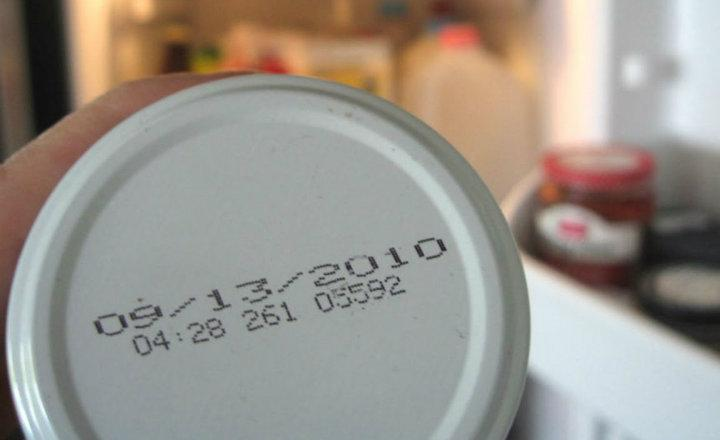

**Digitaliza : 09/13/2010**

**Emite un sonido de alerta, pues a la fecha de hoy esta vencido**

 **Imágenes**

In [ ]:
!sudo apt install tesseract-ocr
!sudo apt install libtesseract-dev
!sudo apt-get install tesseract-ocr-eng
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 40 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 7s (689 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl5/

In [ ]:
from skimage import io
from skimage.morphology import  thin,skeletonize
import cv2
from google.colab.patches import cv2_imshow
import pytesseract
import os
import subprocess
import matplotlib.pyplot as plt
import numpy as np

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


**La funcion getAllImgNames() busca el nombre de todas las images en un directorio dado, recibe un unico parametro que es la ruta donde esta el dataset.Se la utilzara para posteriormente cargar imagenes una a una, en caso que el nombre no siga ningun patron. Retorna una lista con  los nombres de las imagenes**

In [ ]:
def getAllImgNames(path):
  names=[]
  result=subprocess.run(['ls', '-l',path], stdout=subprocess.PIPE)
  result=str(result.stdout).split("\\n")

  for i  in result:
    name=i.split(" ")
    indexName=len(name)-1
    names.append(name[indexName]) if name[indexName].find(".") is not -1 else 0

  return names


In [ ]:
getAllImgNames("/content/drive/MyDrive/ComputerVision/Dataset/Up")

['IMG_20210911_094136.jpg',
 'IMG_20210911_164608.jpg',
 'IMG_20210911_164629.jpg',
 'IMG_20210911_164708.jpg',
 'IMG_20210911_164728.jpg',
 'IMG_20210911_164749.jpg',
 'IMG_20210911_164809.jpg',
 'IMG_20210911_164827.jpg',
 'IMG_20210911_164853.jpg',
 'IMG_20210911_164918.jpg',
 'IMG_20210911_164941.jpg',
 'IMG_20210911_165008.jpg',
 'IMG_20210911_165034.jpg',
 'IMG_20210911_165109.jpg',
 'IMG_20210911_165137.jpg',
 'IMG_20210911_165230.jpg',
 'IMG_20210911_165247.jpg',
 'IMG_20210911_165314.jpg',
 'IMG_20210911_165340.jpg',
 'IMG_20210911_165519.jpg']

In [ ]:
def loadImg(name):
  img =cv2.imread(name)


  imgGray = cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

  return imgGray


In [ ]:
# Convert from BGR to HSV
img =cv2.imread("/content/drive/MyDrive/ComputerVision/Dataset/Up/IMG_20210911_094136.jpg")
img=setSize(img,(400,400))
img_hsv = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
# Extract the V channel
#out_img = img_hsv[:,:,2]


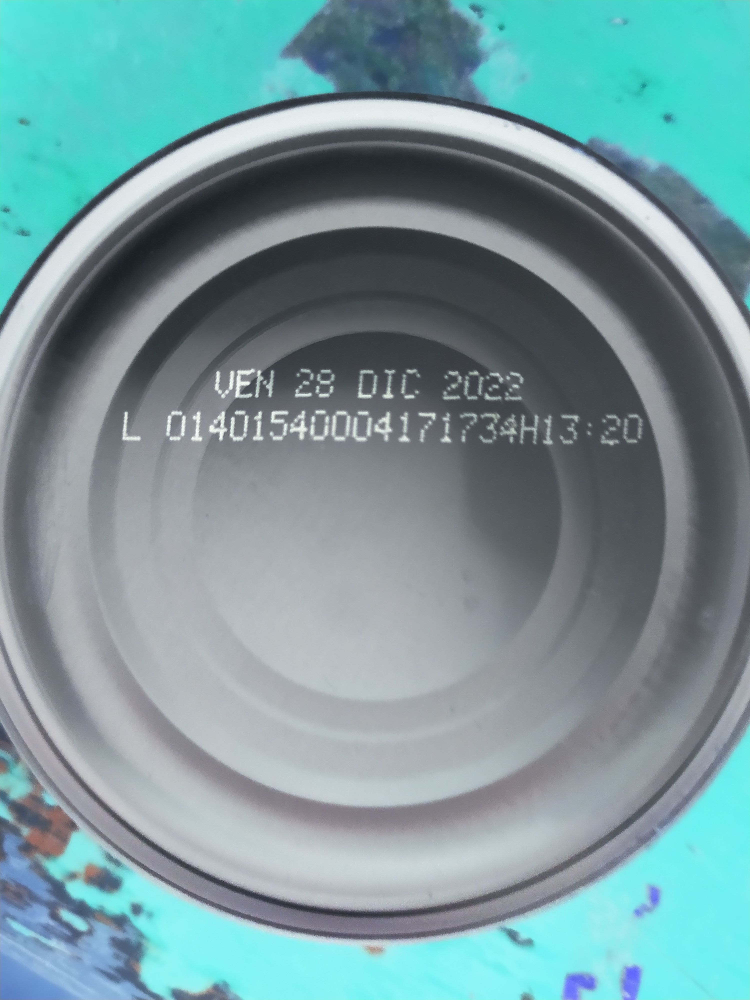

In [ ]:
cv2_imshow(255-img)

In [ ]:

#out_img=cv2.erode(out_img,kernel = np.ones((5,5), np.uint8),iterations=1)

In [ ]:
mask=cv2.inRange(out_img,(70,25,25),(140,255,255))
imask=mask>0
mask_black=np.zeros_like(out_img,np.uint8)
mask_black[imask]=out_img[imask]
#out_img=cv2.bitwise_and(out_img,out_img,mask)

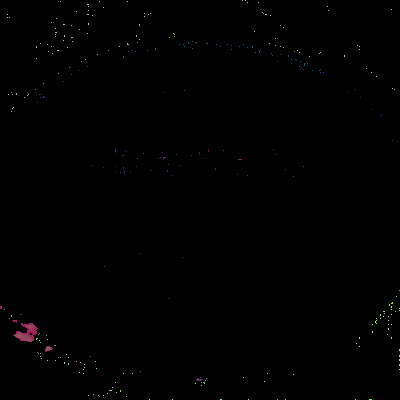

In [ ]:
cv2_imshow(mask_black)


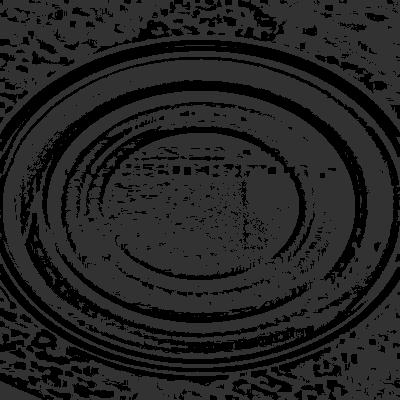

In [ ]:
cv2_imshow(out_img)

In [ ]:
from skimage.morphology import skeletonize, thin
img_threshold=loadImg("/content/drive/MyDrive/ComputerVision/dataset_c/estaaaaaaaaaaaaaa.jpg")
skeleton = skeletonize(img_threshold/255)
thinned = thin(img_threshold/255)
thinned_partial = thin(img_threshold/255, max_iter=1)

fig, axes = plt.subplots(2, 2, figsize=(30, 30), sharex=True, sharey=True)
ax = axes.ravel()

ax[0].imshow(img_threshold, cmap=plt.cm.gray)
ax[0].set_title('original')
ax[0].axis('off')

ax[1].imshow(skeleton, cmap=plt.cm.gray)
ax[1].set_title('skeleton')
ax[1].axis('off')

ax[2].imshow(thinned, cmap=plt.cm.gray)
ax[2].set_title('thinned')
ax[2].axis('off')

ax[3].imshow(thinned_partial, cmap=plt.cm.gray)
ax[3].set_title('partially thinned')
ax[3].axis('off')

fig.tight_layout()
plt.show()

error: ignored

In [ ]:
def setSize(img,dims=(400,600)):
  img = cv2.resize(img,dims,cv2.INTER_AREA)
  return img

In [ ]:
def thre(img,range_u=[70,255]):
  #cv2.THRESH_TOZERO
  #cv2.THRESH_TRUNC
  ret,img = cv2.threshold(img,range_u[0],range_u[1],cv2.THRESH_BINARY)
  #img=cv2.adaptiveThreshold(img,255,cv2.ADAPTIVE_THRESH_MEAN_C,cv2.THRESH_BINARY,11,2) se ve mejor pero genera mucho ruido
  blur = cv2.GaussianBlur(img,(5,5),0)
  #ret3,img = cv2.threshold(blur,0,255,cv2.THRESH_BINARY+cv2.THRESH_OTSU)
  return img

In [ ]:
def dilatacion(img,iterations = 1,kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))):
  dilate = cv2.dilate(img,kernel,iterations)

  im=(img,dilate)
  return im


In [ ]:
def erocion(img,iterations = 1,kernel = cv2.getStructuringElement(cv2.MORPH_RECT,(3,3))):


  er = cv2.erode(img,kernel,iterations)

  im=(img,er)
  return im


**La  funcion textProces() es utilizada para hacer una primera limpieza en la salida del ocr, ya que usualmente contienen informacion inutil y que dificulta la lectura, su unico parametro es una cadena la cual, como debe tener un formato cercano al de una fecha, se elimina cadenas donde solo haya letras.**

In [ ]:
def textProces(text):
  fullText=[]
  text=text.split("\n")

  for line in text:

    for char in line:
      b=char.isdigit()
      if b:
        fullText.append(line)
        break


  return fullText


In [ ]:
# funcion temporal para hacer pruebas exclusivamente con imagenes
def testIm(dataset,size,um_r,TAMANO_ENGROSAMIENTO,ITER_ADELGAZAMIENTO,iterations):
  names=getAllImgNames(dataset)
  images=[]
  for i in names:
    im=loadImg(dataset+i)
    im=setSize(im,size)
    im=thre(im,um_r)

    #im_total=aperturaCierre(im)# existio una buena respuesta en apertura
    #j,im_total=erocion(im,2,cv2.getStructuringElement(cv2.MORPH_RECT,(2,2))) # buen resultado
    kernel = np.array((
            [0, 1, 0],
            [1, 1, 1],
            [0, 1, 0]), dtype="int")
    #im_total = cv2.morphologyEx(im, cv2.MORPH_HITMISS, cv2.getStructuringElement(cv2.MORPH_OPEN,(2,2)))

    images.append(im)
    cv2_imshow(cv2.hconcat((im,im_total)))


In [ ]:
testIm("/content/drive/MyDrive/ComputerVision/Dataset/",(500,500),[70,255],None,None,4)

In [ ]:
def main(dataset,size,um_r):
  names=getAllImgNames(dataset)
  images=[]
  fechas=[]

  for i in names:
    im=loadImg(dataset+i)
    im=setSize(im,size)
    im_total=thre(im,um_r)
    #j,im_total=erocion(im_total,1,cv2.getStructuringElement(cv2.MORPH_ELLIPSE,(3,3))) # buen resultado
    kernel = np.array((
            [0, 1, 0],
            [1, 1, 1],
            [0, 1, 0]), dtype="int")
    #im_total = cv2.morphologyEx(im_total, cv2.MORPH_CLOSE, cv2.getStructuringElement(cv2.MORPH_RECT,(3,3)))
    images.append(im_total)
    cv2_imshow(im_total)
  for i in images:
    fecha=pytesseract.image_to_string(i)
    fecha=textProces(fecha)
    fechas.append(fecha)

  return fechas


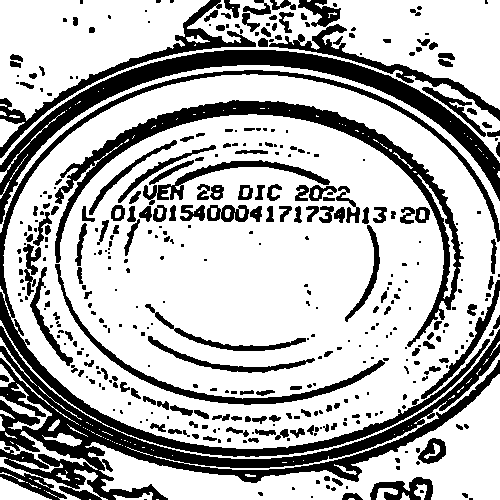

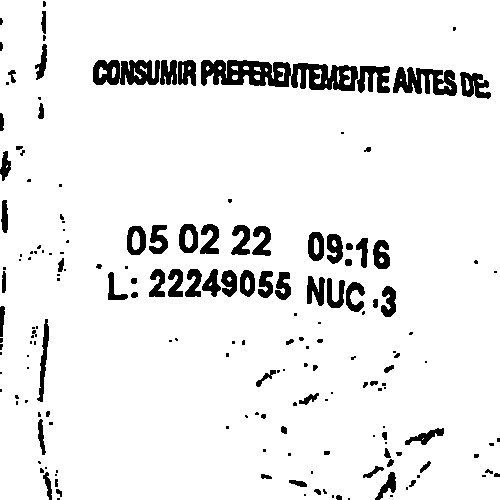

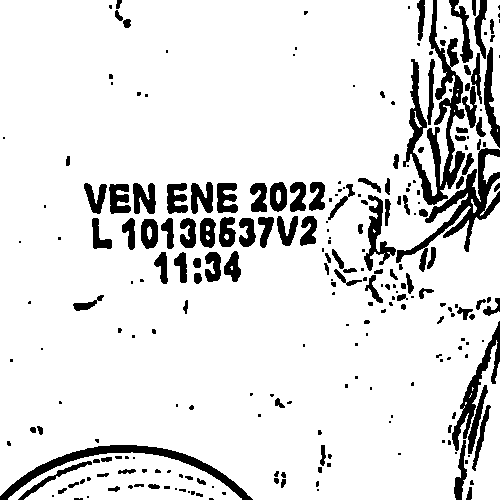

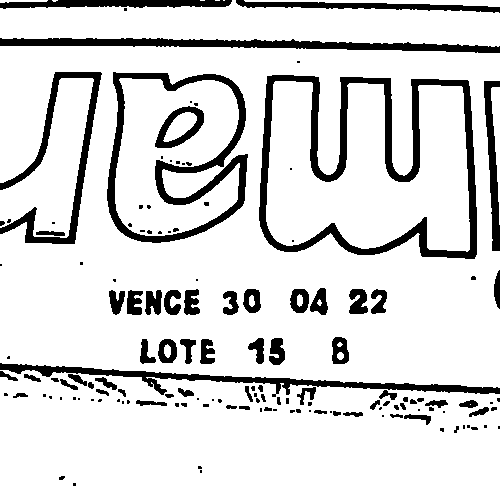

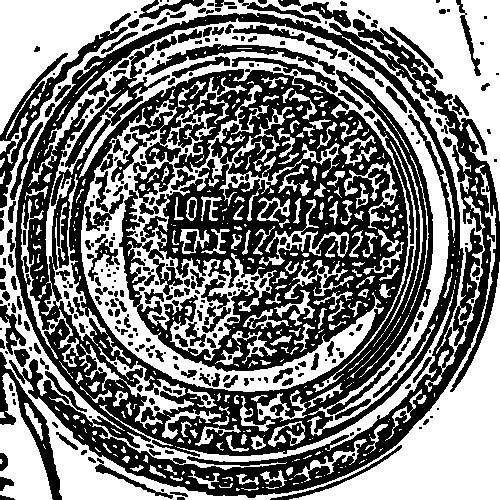

...

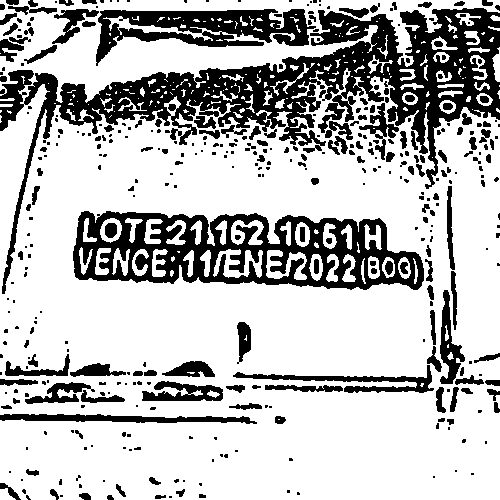

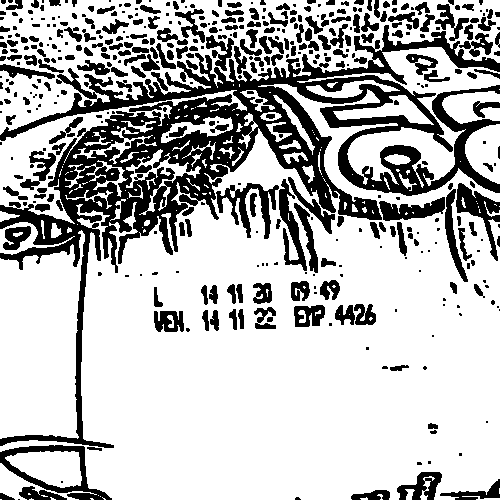

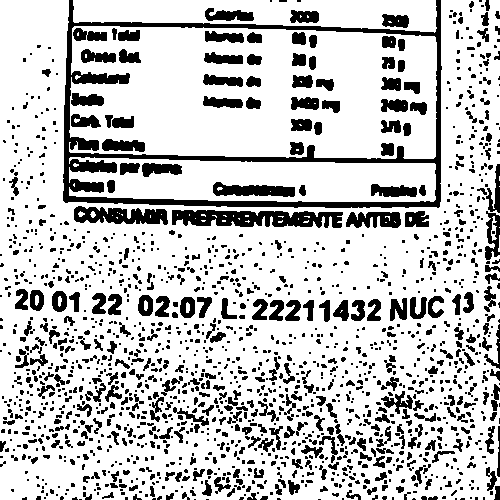

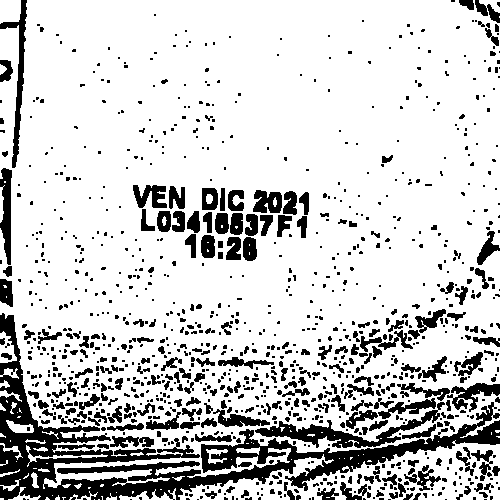

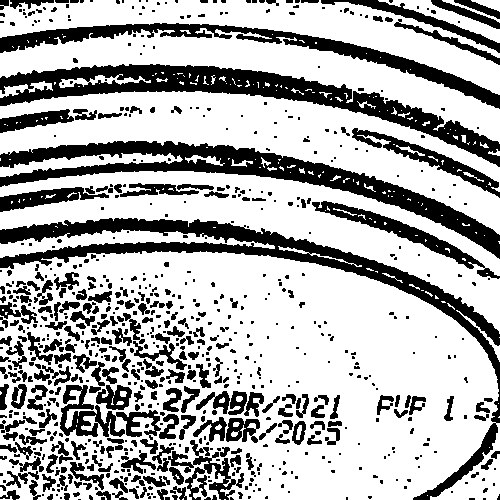

In [ ]:
dates=main("/content/drive/MyDrive/ComputerVision/Dataset/Up/",(500,500),[70,255]) # LO MEJORES PARAMETROS AL MOMENTO


In [ ]:
for date in dates:
  print(date)

[]
['050222 ete', '© | 22249056 ” 3']
[]
['VENCE 30 04 22', 'LOTTE 15 8']
[]
[]
[]
['EXP 2022 07 24 1 236151', 'PUP $3.10 72 20:28:07']
[]
[]
[]
['LOTE21 162 10:51', 'tt SR 2 red ce)']
[]
['ENOULCE 4 Su GUSTO / NC', '_ VEN 180623 11:59 C7 R10']
['VEN 05 0S 22 ENP 2490-7979']
[]
[]
[]
[]
[]


<h1 align = 'center'><b>Parámetros de evaluación del proyecto</b></h1>

- El proyecto debe ser entregado en un notebook de google Colab
- Se debe compartir un enlace con la carpeta en el que se encuentre el notebook con las imágenes.
- Este debe contener un texto siguiendo la estructura:
    - Introduccción: explicación del proyecto, descripción del problema, posibles desafíos, metodología utilizada.
    - Desarrollo: Debe contener eplicación del código a utilizado así como las deciciones que llevaron a utilizar funciones, librerías, umbrales, parámetros. Se recomienda separa el código por bloques y explicar cada una de las decisiones tomadas y funciones implementadas.
    - Automatización: Se debe trabajar con por lo menos 30 imágenes. El proceso debe ser en lo posible automático.
    - Conclusiones: Describa las conclusiones que obtuvieron durante el desarrollo del proyecto.

- Criterios de evaluación:
  - Descripción del problema.
  - Organización del código.
  - Funcionamiento.
  - Análisis.
  - Conclusiones.  

<div align='center'><img src='https://drive.google.com/uc?export=view&id=1T4aS42nUzkYH_H1QStKW00aFm7S2og1f' width="800">